# CAT Risk Modelling Sandbox

Copyright 2025 - A. Mignan<br>
_License_: MIT, https://opensource.org/license/mit<br>
_Version_: 1.1

<div class="alert alert-block alert-info"> <b>Supplementary material to</b><br>
Mignan, A. (2025), Introduction to Catastrophe Risk Modelling. A Physics-based Approach. Cambridge University Press, doi: 10.1017/9781009437370</div>

This tutorial acts as a guide to catastrophe (CAT) risk modelling, streamlining the intricate processes typically associated with developing a CAT model while retaining a realistic context. This is achieved by implementing various perils in a virtual environment, as represented in Figure 1 (Fig. 3.10 in the accompanying textbook):

<center><img src="figures/fig3_10_sandbox_env_COLOR.jpg" width = 800></center>
<center><small><b>Fig. 1.</b> Instance of the virtual region generated for the CAT Risk Modelling Sandbox, here illustrating the topography and land use layers (the latter consisting of a water mass, built area, and road network) – Simulation rendered with Rayshader (Morgan-Wall, 2023, https://www.rayshader.com/).</small></center>

<br>

To obtain a virtual region that is realistic enough in the context of risk assessment, environmental layers were first defined that consist of sets of variables $\Theta(x,y)$ within a spatial grid of coordinates $(x, y)$. These layers are subject to modifications by environmental objects, linked or not to peril sources, and they interact with one another. Currently (v.1.1), these layers comprise the topography characterised by elevation $z(x, y)$, the soil depth $h_s(x, y)$ and the land use denoted by state $\mathcal{S}(x,y)$ (including water bodies, grasslands, forests, and urban areas). The urban component is further subdivided into residential, commercial and industrial zones. Additionally, the coordinates of a road network are provided.

Ten perils are considered in version 1.1:

| ID | Peril | Peril type | Source class | Event size | Intensity class | Intensity measure |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- |
|  | **NATURAL** |  |  |  |  |  |
| `AI` | Asteroid impact | Primary | Point | Kinetic energy [kt] | Analytical | Overpressure [kPa] |
| `EQ` | Earthquake | Primary | Line | Magnitude | Analytical | Peak ground acceleration [m/s$^2$] |
| `FF` | Fluvial flood | Secondary (to `RS`) | Point | Peak flow | Cellular automaton | Inundation depth [m] |
| `LS` | Landslide | Secondary (to `RS`) | Diffuse | Area [km$^2$] | Cellular automaton | Thickness [m] |
| `RS` | Rainstorm | Primary (invisible$^*$) | Area | Rain intensity [mm/hr] | Threshold | - |
| `SS` | Storm surge | Secondary (to `WS`) | Line | Coastal surge height [m] | Threshold | Inundation depth [m] |
| `TC` | Tropical cyclone | Primary | Track | Max. wind speed [m/s] | Analytical | Max. wind speed [m/s] |
| `VE` | Volcanic eruption | Primary | Point | Volume erupted [km$^3$] | Analytical | Ash load [kPa] |
| `WF` | Wildfire | Primary | Diffuse | Burnt area | Cellular automaton | Burnt/not burnt |
|  | **TECHNOLOGICAL** |  |  |  |  |  |
| `Ex` | Explosion (industrial) | Primary | Point | TNT mass [kt] | Analytical | Overpressure $P$ [kPa] |

<small>$^*$ Rainstorm is called an invisible peril since it does not cause any direct damage in the present framework. It is implemented as both the landslide and fluvial flood triggering mechanism.</small>

Despite the minimalism of the simulated environment, it captures crucial spatial correlations among various environmental layers, perils, and assets at risk. For instance, the topography plays a significant role: urban development tends to concentrate in flat regions susceptible to flooding, while mountainous areas are prone to landslides, where they can be triggered by earthquakes. Other such correlations will become apparent throughout the tutorial.

Additional insights can be found in Section 3.3.3 of the textbook. This tutorial stems from the ongoing development of the Generic Multi-Risk (GenMR) framework by the author. For future updates, visit https://github.com/amignan/Intro2CATriskModelling or https://github.com/amignan/GenMR). Details about the generation of the virtual topography layer are outlined in Mignan (2022), A Digital Template for the Generic Multi‐Risk (GenMR) Framework: A Virtual Natural Environment. Int. J. Environ. Res. Public Health, 19, 16097. https://doi.org/10.3390/ijerph192316097). For the generation process of the urban layer, refer to Boxes 3.1-3.3 of the textbook (3.1 'Modelling urban land-use patterns', 3.2 'Modelling road networks', 3.3 'Modelling built-up land footprints'). Python code snippets are used in the notebook cells while complete codes for CAT modelling are located in `CATRiskModellingSandbox_codes.py`.

**DISCLAIMER:** The following material is intended solely for educational purposes. To ensure code readability and facilitate quick understanding, numerous simplifications to hazard and risk processes have been introduced. This sandbox provides users with a starting point to independently develop more advanced models, with additional guidance from the accompanying textbook.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import warnings

import CATRiskModellingSandbox_codes as codes    # <- read the .py file for the CAT models & other tools

warnings.filterwarnings('ignore')
pd.set_option("display.max_rows", None)
plt.rcParams['font.size'] = '20'
wd = os.getcwd()    # working directory

## 1. Input data 

The first step consists in loading the environmental layers and its associated peril sources, as well as in defining additional peril sources which were not part of the virtual region generation process. These data will later be used to generate stochastic event sets and hazard intensity footprints. An exposure footprint is also defined from the loaded land-use layer alongside a collection of generic vulnerability curves.

### 1.1. Environmental layer loading

Environmental layers were generated outside of this tutorial for v1.1 of the sandbox. Files are located in the `inputs/` folder.

In [2]:
file_grid = 'grid.json'                                                  # (x,y) grid [km]
file_src = 'src.json'                                                    # peril sources (with impact on topo.)
file_topoLayer = 'layer_topo_z.npy'                                      # topography z(x,y) [m]
file_soilLayer = 'layer_soil_hs.npy'                                     # soil depth h_s(x,y) [m]
file_landuseLayer = 'layer_landuse_S.npy'                                # land use state \mathcal{S}(x,y)
file_roadNetLayer = 'layer_roadNetwork.npy'                              # road network edges
src = codes.load_json2dict(wd+'/inputs/' + file_src)
grid = codes.RasterGrid(codes.load_json2dict(wd+'/inputs/' + file_grid))
topoLayer_z = np.load(wd+'/inputs/' + file_topoLayer)
soilLayer_hs = np.load(wd+'/inputs/' + file_soilLayer)
landuseLayer_state = np.load(wd+'/inputs/' + file_landuseLayer)
roadNetwork = np.load(wd+'/inputs/' + file_roadNetLayer)

src['grid_A_km2'] = (grid.xmax - grid.xmin) * (grid.ymax - grid.ymin)    # virtual region area [km2]

The following plots, displayed with the function `plot_envLayers()`, represent the environmental layers of the virtual region, as well as the peril sources which had an impact on topography generation (Mignan, 2022). Those consist of:
* 3 earthquake fault segments
* 1 volcano
* 1 river (modelled as a damped sine wave function, see `calc_coord_river_dampedsine()`)

Other peril sources, with no impact on the environmental layers, will be defined next. Note that the dotted box represents the 100 x 100-km region of interest for risk assessment (an outer buffer zone is used to avoid potential boundary effects).

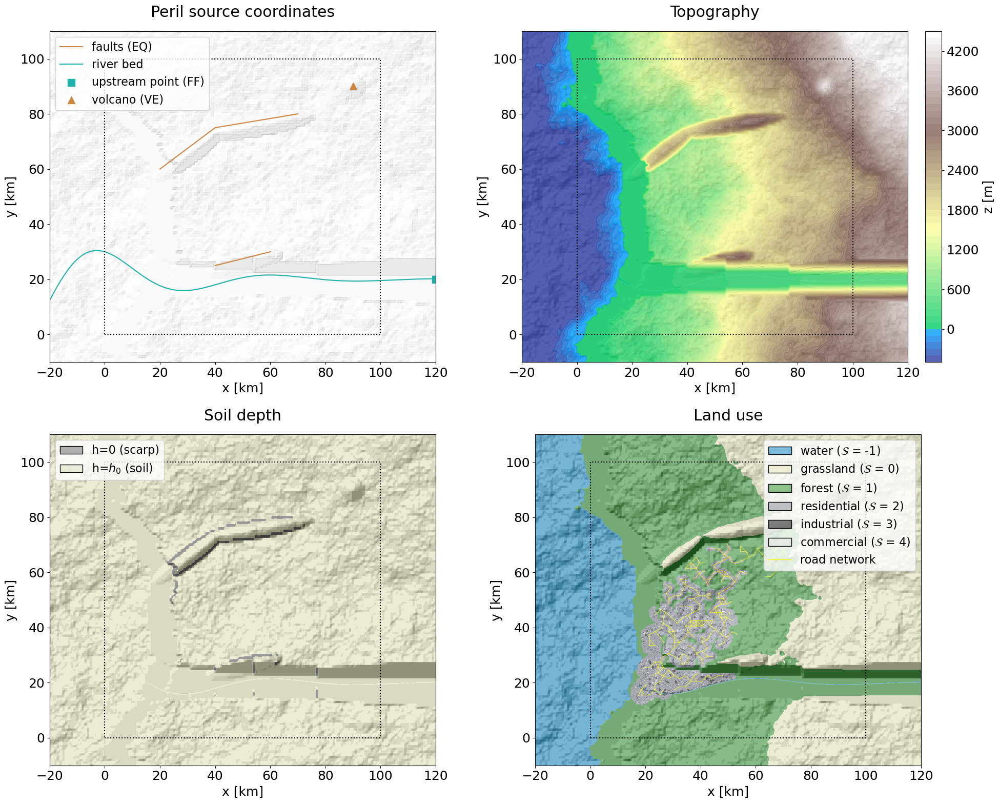

In [3]:
codes.plot_envLayers(grid, src, topoLayer_z, soilLayer_hs, landuseLayer_state, roadNetwork)

**NOTE TO THE USER:** The data previously loaded should not be modified since they are interrelated and generated outside the CAT risk modelling sandbox. However, all the variables and parameters defined in the next cells can be modified to explore the impact of different options.


### 1.2. Peril source definition

Source characteristics were hard-coded for earthquakes, volcanic eruptions and fluvial floods (in loaded dictionary `src`). Additional localised peril sources (`SS`, `AI`, `WS`) will now be introduced, which have no direct impact on the environmental layers currently defined.

The number of stochastic events to emerge from these sources is also defined in `src` for ease of use. Note that the number of such events is kept to a minimum for illustration purposes; at least thousands (instead of tens!) of events should ideally be generated for robust hazard sampling.

Rerun the next cell to generate a different stochastic set:

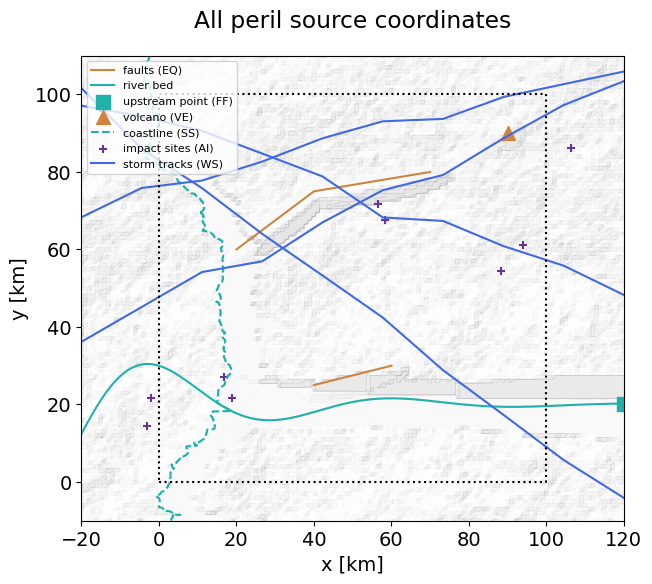

In [3]:
src['perils'] = ['AI','EQ','RS','TC','VE','LS','SS']

src['EQ']['N'] = 20   # to be later distributed over 3 fault segments
src['VE']['N'] = 3

# storm surge: line source matching the North-South coastline:
x_coastline = [grid.x[topoLayer_z[:,j] <= 0][-1] for j in range(grid.ny)]
y_coastline = grid.y
src['SS'] = {'object': 'coastline', 'x': x_coastline, 'y': y_coastline}

# n_AI random uniform asteroid impacts (point sources) in the virtual region:
N_AI = 10
src['AI'] = {'object': 'impact', 'N': N_AI, 'x': grid.xmin + np.random.random(N_AI) * (grid.xmax - grid.xmin), \
                                            'y': grid.ymin + np.random.random(N_AI) * (grid.ymax - grid.ymin)}

# n_TC pseudo-random tracks moving from West to East in the virtual region:
N_TC = 5
npt = 10              # number of points along track, which crosses the grid from West to East
max_deviation = 3     # random uniform deviation along the y-axis at each track point
x_tracks, y_tracks, ID_tracks = codes.gen_rdmcoord_tracks(N_TC, grid, npt, max_deviation)
src['TC'] = {'object': 'storm track', 'N': N_TC, 'x': x_tracks, 'y': y_tracks, 'ID': ID_tracks}

src['RS'] = {'object': 'atmosphere', 'N': 3}  # as trigger of landslides


############################
## plot all peril sources ##
############################
plt.rcParams['font.size'] = '14'
fig, ax = plt.subplots(1, 1, figsize=(7,7))
ax.contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)

for src_i in range(len(src['EQ']['x'])):
    if src_i == 1:
        ax.plot(src['EQ']['x'][src_i], src['EQ']['y'][src_i], color = codes.col_peril('EQ'), \
                label = 'faults (EQ)')
    else:
        ax.plot(src['EQ']['x'][src_i], src['EQ']['y'][src_i], color = codes.col_peril('EQ'))
river_xi, river_yi, _, _ = codes.calc_coord_river_dampedsine(grid, src['FF'])
ax.plot(river_xi, river_yi, color = codes.col_peril('FF'), label = 'river bed')
ax.scatter(np.max(river_xi), src['FF']['riv_y0'][0], s=100, marker = 's', color = codes.col_peril('FF'), \
           label = 'upstream point (FF)')
ax.scatter(src['VE']['x'], src['VE']['x'], color = codes.col_peril('VE'), s=100, marker = '^', \
           label = 'volcano (VE)')
ax.plot(src['SS']['x'], src['SS']['y'], color = codes.col_peril('SS'), linestyle = 'dashed', \
        label = 'coastline (SS)')
ax.scatter(src['AI']['x'], src['AI']['y'], color = codes.col_peril('AI'), s=30, marker = '+', \
           label = 'impact sites (AI)')
for src_i in range(src['TC']['N']):
    indsrc = np.where(src['TC']['ID'] == src_i)[0]
    if src_i == 0:
        ax.plot(src['TC']['x'][indsrc], src['TC']['y'][indsrc], color = codes.col_peril('TC'), \
            label = 'storm tracks (WS)')
    else:
        ax.plot(src['TC']['x'][indsrc], src['TC']['y'][indsrc], color = codes.col_peril('TC'))
        
ax.plot([grid.xmin + grid.xbuffer, grid.xmax - grid.xbuffer, grid.xmax - grid.xbuffer, \
         grid.xmin + grid.xbuffer, grid.xmin + grid.xbuffer],
        [grid.ymin + grid.ybuffer, grid.ymin + grid.ybuffer, grid.ymax - grid.ybuffer, \
         grid.ymax - grid.ybuffer, grid.ymin + grid.ybuffer], linestyle = 'dotted', color = 'black')
ax.set_xlim(grid.xmin, grid.xmax)
ax.set_ylim(grid.ymin, grid.ymax)
ax.set_xlabel('x [km]')
ax.set_ylabel('y [km]')
ax.set_title('All peril source coordinates', pad = 20)
ax.legend(loc = 'upper left', fontsize = 8)
ax.set_aspect(1);

### 1.3. Exposure footprint & vulnerability function definitions

The exposure footprint $\nu(x,y)$ consists of the urban area of the virtual region (land use state $S \ge$ 2). The economic value per cell is calculated from Equation 3.1 of the textbook.

In [4]:
GPD_percapita_USD = 40e3    # [USD] - can be modified by the user to calibrate to different countries
c1 = [24.1, 30.8, 33.6]
c2 = [.385, .325, .357]
expoFootprint = np.full((grid.nx, grid.ny), np.nan)
expoFootprint[landuseLayer_state == 2] = c1[0] * GPD_percapita_USD **c2[0] * (grid.w*1e3)**2 # residential
expoFootprint[landuseLayer_state == 3] = c1[1] * GPD_percapita_USD **c2[1] * (grid.w*1e3)**2 # industrial
expoFootprint[landuseLayer_state == 4] = c1[2] * GPD_percapita_USD **c2[2] * (grid.w*1e3)**2 # commercial

expoFootprint = expoFootprint * .2    # ratio of urban surface covered with buildings

print('Total exposure value [billion USD]:', int(np.nansum(expoFootprint) * 1e-9))

Total exposure value [billion USD]: 326


For sake of simplicity, generic intensity-specific vulnerability functions $D = f_D(I)$ are implemented independently of the building type (hence no need for exposure characteristics $\Theta_{\nu}$ definition). The vulnerability functions (`f_D()`) are listed below and correspond to the equations mentioned in Section 3.2.5 of the textbook:

| ID | Intensity $I$ | Vulnerability function | Parameters |
| :--- | :--- | :--- | :--- |
| `AI`, `Ex` | Blast overpressure $P$ [kPa] | Cum. lognormal distr. (Eq. 3.13)  | $\mu$ = log(20), $\sigma$ = 0.4 |
| `EQ` | Peak ground acceleration PGA [m/s$^2$] | Cum. lognormal distr. (Eq. 3.13) | $\mu$ = log(6), $\sigma$ = 0.6 |
| `FF`, `SS` | Inundation depth $h$ [m] | Square root (Eq. 3.10) | $c$ = 0.45 |
| `LS` | Landslide thickness $h$ [m] | Weibull distr. (Eq. 3.12) | $c_1$ = -1.671, $c_2$ = 3.189, $c_3$ = 1.746 |
| `VE` | Ash load $P$ [kPa] (converted from thickness [m]) | Cum. lognormal distr. (Eq. 3.13) | $\mu$ = 1.6, $\sigma$ = 0.4 |
| `WS` (`TC`) | Maximum wind speed $v_{max}$ [m/s] | Power-law (Eq. 3.14) | $v_{thres}$ = 25.7, $v_{half}$ = 74.7 |

Figure 3.8 of the textbook is retrieved below:

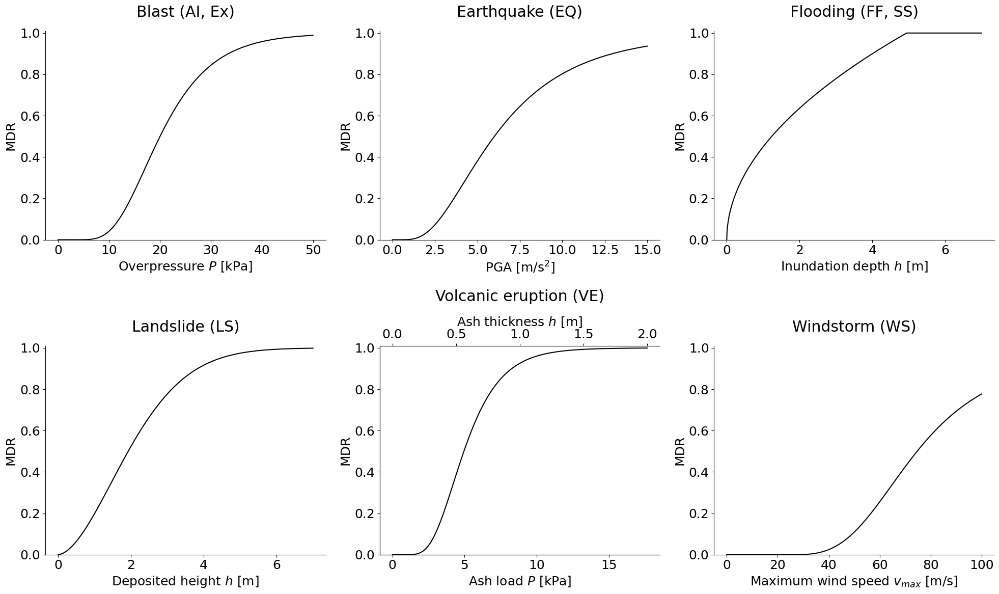

In [6]:
codes.plot_vulnFunctions()

## 2. Stochastic event set generation

The stochastic event set (or event table) consists of a list of events per peril with identifier `evID`, size `S`, and rate `lbd`. Two types of perils will be considered: primary perils for which the rate of occurrence must be assessed and secondary perils which will be assumed to occur in pair with their triggers. In this case, to keep working with an event table (and not a simulation table and adjacency matrix of interactions; see Chapter 5 of the textbook), each trigger event will have a probability of one to cause one target event. Note also that `Ex`, `FF` and `WF` events are not implemented in the stochastic set but will be considered at a later stage to illustrate specific aspects associated to the virtual region.
* Primary perils: `AI`, `EQ`, `RS`, `TC`, `VE`
* Secondary perils: `LS` triggered by `RS` and `SS` triggered by `TC`

This is parameterised in the dictionary `sizeDistr` with:
* Event size incrementation according `Smin`, `Smax` and `Sbin` with binning in `linear` or `log` scale.
* Event size distribution modelled by one of 3 functions: power-law (Eq. 2.38), exponential law (Eq. 2.39), or Generalised Pareto Distribution (GPD, Eq. 2.50).
* Rates of the virtual region are for most perils simply calibrated by taking the ratio of the region area to the area used to obtain event productivity parameters in the textbook (e.g., global or continental United States, CONUS). This is an oversimplification assuming an homogeneous spatial distribution of events but is used as a straightforward way to define rates for the present ad-hoc region.

All calculations take place in the function `gen_evset()`.

Note that the maximum possible event size `Smax` is defined by the user for all perils except for earthquakes, which maximum magnitude is constrained by the maximum fault length. The fault segment length is calculated by the function `get_char_srcLine()` and the maximum magnitude by an empirical relationship (`calc_EQ_length2magnitude()`; Fig. 2.6b in the textbook).

In [5]:
srcEQ_char = codes.get_char_srcLine(src['EQ'])
print('Length of faults [km]:', srcEQ_char['srcL'])
print('Length of fault segments [km]:', srcEQ_char['segL'])

Mmax1 = codes.calc_EQ_length2magnitude(srcEQ_char['srcL'][0])
Mmax2 = codes.calc_EQ_length2magnitude(srcEQ_char['srcL'][1])
Mmax = np.max([Mmax1, Mmax2])
print('Maximum magnitude possible on faults:', Mmax1, Mmax2)

Length of faults [km]: [55.41381265 20.61552813]
Length of fault segments [km]: [25.         30.41381265 20.61552813]
Maximum magnitude possible on faults: 7.1 6.6


In [6]:
sizeDistr = {
    'primary': ['AI','EQ','RS','TC','VE','WF'],
    'secondary': ['LS','SS'],
    # primary perils
    'AI':{
        'Sunit': 'Bolide energy $E$ [kton]',
        'Smin': 10, 'Smax': 1e3, 'Sbin': 1, 'Sscale': 'log',
        'distr': 'powerlaw', 'region': 'global', 'a0': .5677, 'b': .9       # see Sect. 2.3.1
    },
    'EQ':{
        'Sunit': 'Magnitude $M$ []',
        'Smin': 6, 'Smax': Mmax, 'Sbin': .1, 'Sscale': 'linear',
        'distr': 'exponential', 'a': 5, 'b': 1.                    # i.e., one M = a EQ per year (given b = 1)
    },
    'RS':{
        'Sunit': 'Water column [mm/hr]',
        'Smin': 75, 'Smax': 125, 'Sbin': 25, 'Sscale': 'linear',
        'distr': 'GPD', 'region': 'CONUS', 'mu': 50., 'xi': -.051, 'sigma': 11.8, 'Lbdmin0': 522. # see Sect. 2.3.2
    },
    'TC':{
        'Sunit': 'Max. wind speed [m/s]',
        'Smin': 40, 'Smax': 65, 'Sbin': 10, 'Sscale': 'linear',
        'distr': 'GPD', 'region': 'global', 'mu': 33., 'xi': -.280, 'sigma': 17.8,'Lbdmin0': 43.9  # IBTrACS fit
#        , 'Lbdmin': .1      # overwrites Lbdmin derived from Lbdmin0 to directly choose rate(>=Smin) = Lbdmin
    },
    'VE':{
        'Sunit': 'Ash volume [km$^3$]',
        'Smin': 1, 'Smax': 10, 'Sbin': .5, 'Sscale': 'log',
        'distr': 'powerlaw', 'region': 'global', 'a0': -1.155, 'b': .66      # see Sect. 2.3.1
    },
    # secondary perils
    'LS':{'trigger': 'RS'},
    'SS':{'trigger': 'TC'}
}

stochset = codes.gen_eventset(src, sizeDistr)
stochset

,ID,evID,S,lbd
0,AI,AI1,10.000000,1.258426e-05
1,AI,AI2,10.000000,1.258426e-05
2,AI,AI3,10.000000,1.258426e-05
3,AI,AI4,100.000000,1.188199e-06
4,AI,AI5,100.000000,1.188199e-06
5,AI,AI6,100.000000,1.188199e-06
6,AI,AI7,100.000000,1.188199e-06
7,AI,AI8,1000.000000,1.994471e-07
8,AI,AI9,1000.000000,1.994471e-07
9,AI,AI10,1000.000000,1.994471e-07


## 3. Intensity footprint catalogue generation

Once the stochastic event set has been generated, the next step is to generate one hazard intensity footprint per event.

### 3.1. From analytical expressions & threshold models

Analytical expressions are available to calculate intensity $I(x,y) = f_I(S,r)$ for `AI` (same for `Ex`), `EQ`, `VE` and `WS`/`TC` (Section 2.4.1 of the textbook). Size $S$ is available in `stochset` while distance to source $r$ requires to match each event to a source. The match between event and source location is here direct for `AI` and `WS`, where one event occurs per stochastic source. For `VE`, all events occur on the same volcano source. The case of earthquakes is the most complicated since they need to be distributed along the 3 fault segments according to their magnitude (which converts into rupture length).

Equations are taken from Section 2.4.1 of the textbook (models are defined as `calc_I_*(S,r)` in the Python file).

| ID | Event size $S$ | Intensity $I$ | Equation |
| :--- | :--- | :--- | :--- |
| `AI`, `Ex` | Explosive mass $m_{TNT}$ [kt] | Blast overpressure $P$ [kPa] | Eq. 2.56 |
| `EQ` | Magnitude $M$ | Peak ground acceleration PGA [m/s$^2$] | Eq. 2.54 |
| `TC` | Maximum wind speed $v_{max}$ [m/s] | Wind speed $v$ [m/s] | Eq. 2.24 |
| `VE` | Erupted volume $V$ [km$^3$] | Ash load $P$ [kPa] (converted from thickness [m]) | Eq. 2.61 |


Storm surge (`SS`) is the only peril here for which hazard intensity is estimated from a threshold model (Bathtub model; Section 2.4.2). The algorithm is kept very simple, and only applies to the present virtual environment where the background topography has an overall West-East orientation (see function `model_SS_Bathtub()`). As a secondary peril triggered by `TC` events, the `SS` size along the coastline is simply taken from a relationship of the form $h_{max} \propto v_{max}^2$ (Fig. 2.7 of the textbook) with $v_{max}$ the wind speed along the coastline according to the `TC` footprint.

The catalogue of hazard footprints is generated with the function `gen_hazFootprints()` and plotted with `plot_hazFootprints()`. The rupture coordinates of the stochastic earthquakes are computed in `pop_EQ_floatingRupture()`. The earthquake ruptures are shown below in dark red (rerun cell for different samples):

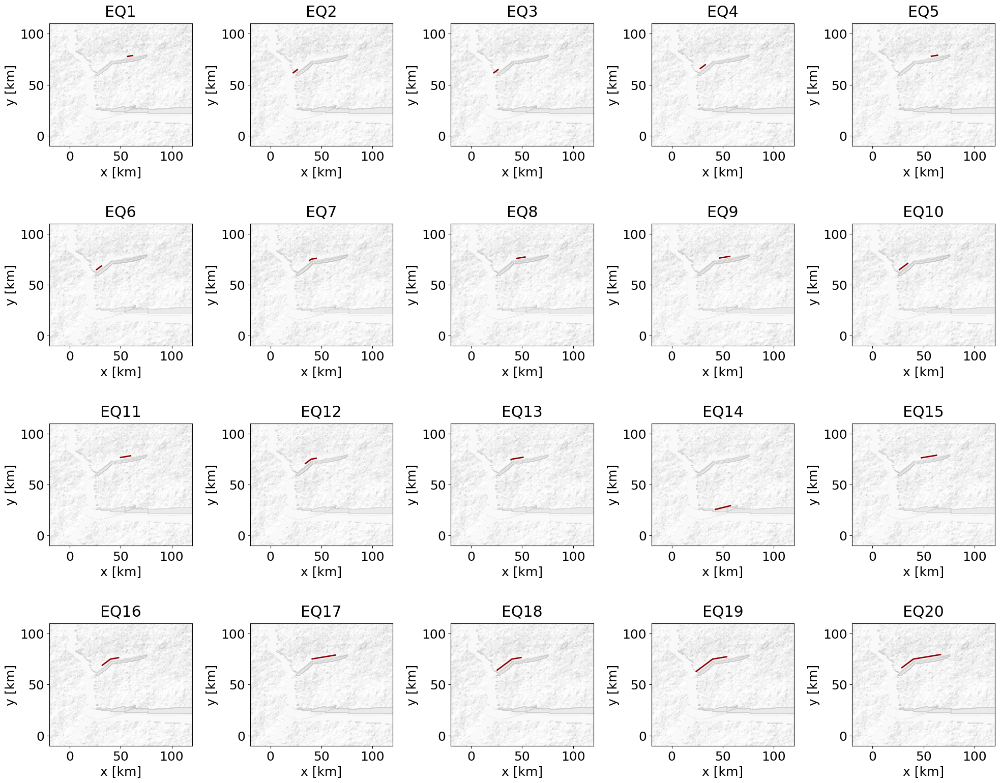

In [7]:
indperil = np.where(stochset['ID'] == 'EQ')[0]
EQ_coords = codes.pop_EQ_floatingRupture(stochset['evID'][indperil].values, stochset['S'][indperil].values, \
                                   src, srcEQ_char)

src['EQ']['rup_coords'] = EQ_coords

plt.rcParams['font.size'] = '18'
fig, ax = plt.subplots(4, 5, figsize=(20,16))
ax = ax.flatten()
for i in range(src['EQ']['N']):
    evID = stochset['evID'][indperil].values[i]
    EQ_coords_evID = EQ_coords[EQ_coords['evID'] == evID]
    ax[i].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
    ax[i].plot(EQ_coords_evID['x'], EQ_coords_evID['y'], color = 'darkred', linewidth = 2)
    ax[i].set_xlim(grid.xmin, grid.xmax)
    ax[i].set_ylim(grid.ymin, grid.ymax)
    ax[i].set_xlabel('x [km]')
    ax[i].set_ylabel('y [km]')
    ax[i].set_title(evID, pad = 10)
    ax[i].set_aspect(1)
plt.tight_layout()
plt.pause(1)   # to avoid rare case where plot not displayed on notebook
plt.show()

In [8]:
# additional atmospheric source parameters:
src['TC']['vforward_m/s'] = 10  # forward storm speed [m/s]    
src['TC']['pn_mbar'] = 1005     # ambient pressure [mbar]
src['TC']['B_Holland'] = 2      # Holland's parameter (see Fig. 2.10 of textbook)
src['TC']['lat_deg'] = grid.lat_deg   # average latitude of virtual environment hardcoded in grid (30 degrees)
src['TC']['bin_km'] = 1.        # spatial resolution of track

# virtual region bathymetry characteristics for SS height given storm wind speed
src['SS']['bathy'] = 'New York harbor'  # 'generic' (Saffir-Simpson, Eq. 2.16), 'New York harbor' (Eq. in Fig. 2.7)

In [9]:
# can take a few minutes...

catalog_hazFootprints = codes.gen_hazFootprints(stochset, src, grid, topoLayer_z)
print(catalog_hazFootprints.keys()) # footprints are catalogued by evID

generating footprints for:
AI
EQ
TC
VE
SS
... catalogue completed
dict_keys(['AI1', 'AI2', 'AI3', 'AI4', 'AI5', 'AI6', 'AI7', 'AI8', 'AI9', 'AI10', 'EQ1', 'EQ2', 'EQ3', 'EQ4', 'EQ5', 'EQ6', 'EQ7', 'EQ8', 'EQ9', 'EQ10', 'EQ11', 'EQ12', 'EQ13', 'EQ14', 'EQ15', 'EQ16', 'EQ17', 'EQ18', 'EQ19', 'EQ20', 'TC1', 'TC2', 'TC3', 'TC4', 'TC5', 'VE1', 'VE2', 'VE3', 'SS_fromTC1', 'SS_fromTC2', 'SS_fromTC3', 'SS_fromTC4', 'SS_fromTC5'])


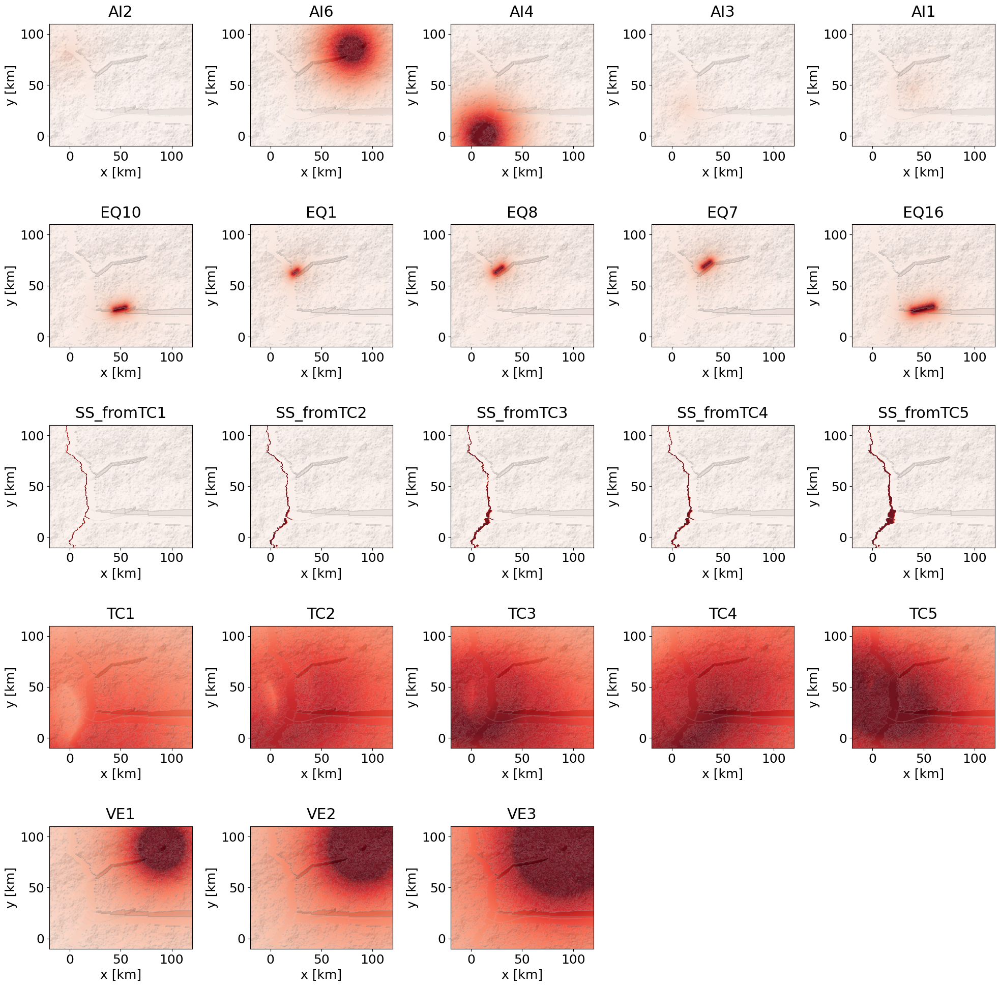

In [12]:
# max intensity Imax in color range [see units in previous table]
# to compare similar levels of expected damage, choose a value per peril for a constant MDR in the vulnerability
# curves (see curves generated by plot_vulnFunctions())
plot_Imax = {'AI': 20, 'EQ': 6, 'VE': .5, 'TC': 70., 'SS': 2., 'LS': 2.}

# nstoch (default = 5) defines the number of events per peril to be displayed by row
# if the number of events > nstoch, footprints are randomly sampled from all possibilities
codes.plot_hazFootprints(catalog_hazFootprints, grid, src, topoLayer_z, plot_Imax)  #, nstoch = 5)

As a side note, observe the `TC` footprint boundary effect (cyclonic eye), which is due to the track artificially starting at grid.xmin.

#### 3.1.1. Tropical cyclone case

If the modelling of `AI`, `EQ` and `VE` intensity footprints is straightforward, this is not the case for `TC`. Therefore, the process is broken down below for clarity (taken from `hazFootprints_analytical()`):
1. Increase track resolution (to later calculate $r$) and define storm size $S(t)$ over time
2. Calculate symmetric intensity footprint per time lapse I(x,y,t) (Eq. 2.24) & add cyclone translation (1st order asymmetry) before obtaining the final footprint $I(x,y) = \max_t I(x,y,t)$

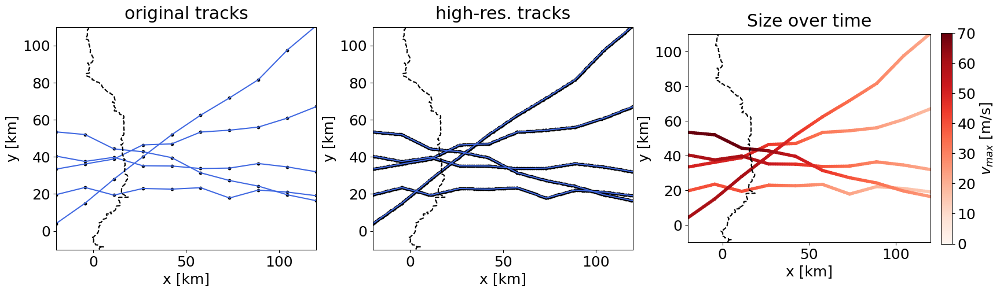

In [13]:
# 1. Increase track resolution (to later calculate $r$) and define storm size $S(t)$ over time

Track_coord = codes.get_TCtrack_highres(src['TC']['x'], src['TC']['y'], src['TC']['ID'], src['TC']['bin_km'])
S_alongtrack = codes.calc_S_track(stochset, src, Track_coord) # ad-hoc inland decay of windspeed

plt.rcParams['font.size'] = '18'
fig, ax = plt.subplots(1, 3, figsize=(20,5))

ax[0].scatter(src['TC']['x'], src['TC']['y'], color = 'black', s = 10)
for i in range(src['TC']['N']):
    indtrack = src['TC']['ID'] == i+1
    ax[0].plot(src['TC']['x'][indtrack], src['TC']['y'][indtrack], color = codes.col_peril('TC'))
ax[0].plot(src['SS']['x'], src['SS']['y'], color = 'black', linestyle = 'dashed')
ax[0].set_xlabel('x [km]')
ax[0].set_ylabel('y [km]')
ax[0].set_title('original tracks', pad = 10)
ax[0].set_xlim(grid.xmin, grid.xmax)
ax[0].set_ylim(grid.ymin, grid.ymax)
ax[0].set_aspect(1)

ax[1].scatter(Track_coord['x'], Track_coord['y'], color = 'black', s = 10)
for i in range(src['TC']['N']):
    indtrack = Track_coord['ID'] == i+1
    ax[1].plot(Track_coord['x'][indtrack], Track_coord['y'][indtrack], color = codes.col_peril('TC'))
ax[1].plot(src['SS']['x'], src['SS']['y'], color = 'black', linestyle = 'dashed')
ax[1].set_xlabel('x [km]')
ax[1].set_ylabel('y [km]')
ax[1].set_title('high-res. tracks', pad = 10)
ax[1].set_xlim(grid.xmin, grid.xmax)
ax[1].set_ylim(grid.ymin, grid.ymax)
ax[1].set_aspect(1)

for i in range(src['TC']['N']):
    indtrack = Track_coord['ID'] == i+1
    img = ax[2].scatter(Track_coord['x'][indtrack], Track_coord['y'][indtrack], c = S_alongtrack['TC'+str(i+1)], \
                        cmap = 'Reds', vmin=0, vmax=70, s = 10)
ax[2].plot(src['SS']['x'], src['SS']['y'], color = 'black', linestyle = 'dashed')
ax[2].set_xlabel('x [km]')
ax[2].set_ylabel('y [km]')
ax[2].set_title('Size over time', pad = 10)
ax[2].set_xlim(grid.xmin, grid.xmax)
ax[2].set_ylim(grid.ymin, grid.ymax)
ax[2].set_aspect(1)
fig.colorbar(img, ax = ax[2], fraction = .04, pad = .04, label = '$v_{max}$ [m/s]');

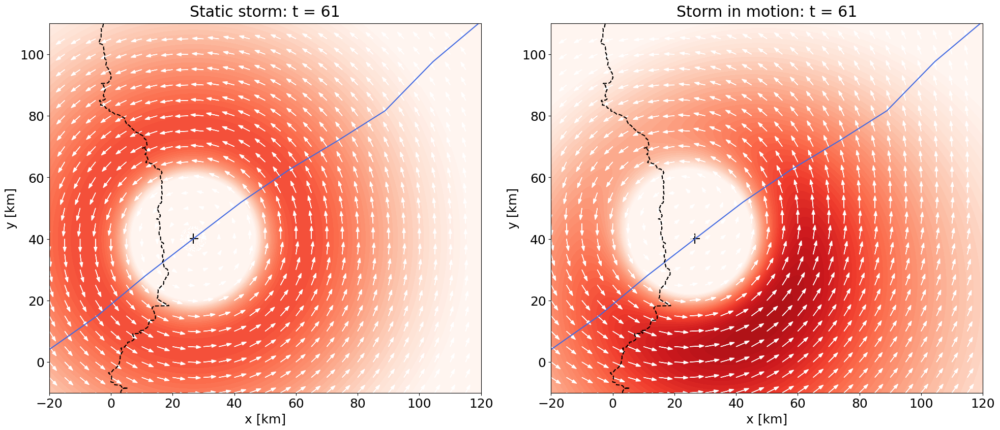

In [14]:
# 2. Calculate symmetric intensity footprint per time lapse I(x,y,t) (Eq. 2.24)
# & add cyclone translation (1st order asymmetry)

evID = 'TC4'       # choose a TC event

indtrack = np.where(Track_coord['ID'] == int(evID[2]))[0]
track_x = Track_coord['x'][indtrack].values
track_y = Track_coord['y'][indtrack].values
track_S = S_alongtrack[evID]
npt = len(indtrack)

t = npt // 3   # choose a time increment along track (a fraction of npt)

# excerpt from gen_hazFootprints()
r = np.sqrt((grid.xx - track_x[t])**2 + (grid.yy - track_y[t])**2)     # point source at time t
I_sym_t = codes.calc_I_v_ms(track_S[t], r, src['TC'])
I_asym_t, vtot_x, vtot_y, vtan_x, vtan_y = \
    codes.add_v_forward(src['TC']['vforward_m/s'], I_sym_t, track_x, track_y, grid, t)


plt.rcParams['font.size'] = '18'
fig, ax = plt.subplots(1, 2, figsize=(20,10))

indtrack = src['TC']['ID'] == int(evID[2])
Imax = plot_Imax['TC']
I_plt = np.copy(I_sym_t)
I_plt[I_plt >= Imax] = Imax
ax[0].contourf(grid.xx, grid.yy, I_plt, cmap = 'Reds', levels = np.linspace(0, Imax, 100), vmin=33, vmax=Imax)
ax[0].plot(src['TC']['x'][indtrack], src['TC']['y'][indtrack], color = codes.col_peril('TC'))
ax[0].plot(src['SS']['x'], src['SS']['y'], color = 'black', linestyle = 'dashed')
ax[0].scatter(track_x[t], track_y[t], marker = '+', color = 'black', s = 200)
delta = 50
for i in range(int(grid.xx.shape[0]/delta)):
    for j in range(int(grid.xx.shape[1]/delta)):
        ax[0].arrow(grid.xx[delta*i,delta*j], grid.yy[delta*i,delta*j], 
            .05 * vtan_x[delta*i,delta*j], .05* vtan_y[delta*i,delta*j], head_width = 1, color = 'white')
ax[0].set_xlabel('x [km]')
ax[0].set_ylabel('y [km]')
ax[0].set_title('Static storm: t = '+str(t), pad = 10)
ax[0].set_xlim(grid.xmin, grid.xmax)
ax[0].set_ylim(grid.ymin, grid.ymax)
ax[0].set_aspect(1)

I_plt = np.copy(I_asym_t)
I_plt[I_plt >= Imax] = Imax
ax[1].contourf(grid.xx, grid.yy, I_plt, cmap = 'Reds', levels = np.linspace(0, Imax, 100), vmin=33, vmax=Imax)
ax[1].plot(src['TC']['x'][indtrack], src['TC']['y'][indtrack], color = codes.col_peril('TC'))
ax[1].plot(src['SS']['x'], src['SS']['y'], color = 'black', linestyle = 'dashed')
ax[1].scatter(track_x[t], track_y[t], marker = '+', color = 'black', s = 200)
delta = 50
for i in range(int(grid.xx.shape[0]/delta)):
    for j in range(int(grid.xx.shape[1]/delta)):
        ax[1].arrow(grid.xx[delta*i,delta*j], grid.yy[delta*i,delta*j], 
            .05 * vtot_x[delta*i,delta*j], .05* vtot_y[delta*i,delta*j], head_width = 1, color = 'white')
ax[1].set_xlabel('x [km]')
ax[1].set_ylabel('y [km]')
ax[1].set_title('Storm in motion: t = '+str(t), pad = 10)
ax[1].set_xlim(grid.xmin, grid.xmax)
ax[1].set_ylim(grid.ymin, grid.ymax)
ax[1].set_aspect(1)
plt.tight_layout();

The left map represents the static footprint, according to the Holland model (Eq. 2.24), at time `t`, with the intensity the gradient-level azimuthal wind speed (visualised via the vector field). The right figure includes the forward motion (`src['TC']['vforward_m/s']`) of the storm, which leads to an asymmetric footprint. The final event footprint take the maximum wind speed observed per grid cell over the track time increments.

#### 3.1.2. Example of an industrial explosion

Let us here define the footprint of an industrial explosion (`Ex`) to consider, for completeness, an example of human-made disaster. The site is chosen from the grid cells located in an industrial zone, here, a harbor. Note that this event is not included in the event table.

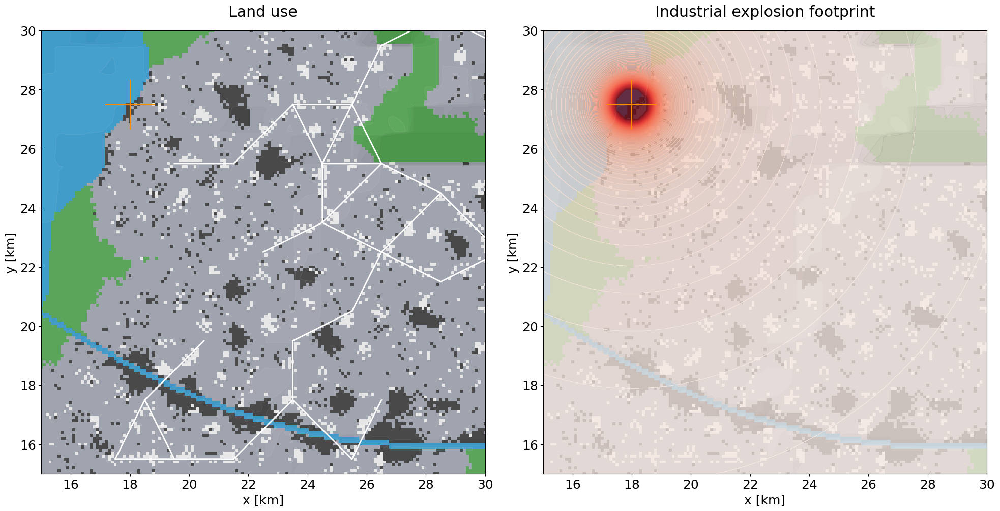

In [15]:
# industrial explosion: one point source in an industrial cell (S(x,y) = 3, darkgrey) in harbor:
src['Ex'] = {'object': 'industrial site', 'x': [18], 'y': [27.5], 'N': 1}

S = 1  # [kton TNT] extreme scenario
r = np.sqrt((grid.xx - src['Ex']['x'][0])**2 + (grid.yy - src['Ex']['y'][0])**2)   # point source
Ex_footprint = codes.calc_I_blast_kPa(S, r)


plt.rcParams['font.size'] = '18'
fig, ax = plt.subplots(1, 2, figsize=(20,10))

ax[0].pcolormesh(grid.xx, grid.yy, landuseLayer_state, cmap = codes.col_S, vmin=-1, vmax=5, alpha = .8)
ax[0].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
ax[0].plot(roadNetwork[0], roadNetwork[1], color='white', lw = 2)
ax[0].scatter(src['Ex']['x'], src['Ex']['y'], color = 'darkorange', marker = '+', s = 5000)
ax[0].set_xlim(15,30)
ax[0].set_ylim(15,30)
ax[0].set_xlabel('x [km]')
ax[0].set_ylabel('y [km]')
ax[0].set_title('Land use', pad = 20)
ax[0].set_aspect(1)

plot_Imax['Ex'] = 4 * 6.89476  # kPa (here 4 psi as threshold of total destruction)
Imax = plot_Imax['Ex']
I_plt = np.copy(Ex_footprint)
I_plt[I_plt >= Imax] = Imax
ax[1].pcolormesh(grid.xx, grid.yy, landuseLayer_state, cmap = codes.col_S, vmin=-1, vmax=5)
ax[1].contourf(grid.xx, grid.yy, I_plt, cmap = 'Reds', levels = np.linspace(0, Imax, 100), alpha = .8)
ax[1].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
ax[1].scatter(src['Ex']['x'], src['Ex']['y'], color = 'darkorange', marker = '+', s = 5000)
ax[1].set_xlim(15,30)
ax[1].set_ylim(15,30)
ax[1].set_xlabel('x [km]')
ax[1].set_ylabel('y [km]')
ax[1].set_title('Industrial explosion footprint', pad = 20)
ax[1].set_aspect(1)
plt.tight_layout();

### 3.2. From numerical models (cellular automata)

The following perils require numerical modelling of their hazard footprints: `LS`, `WF` and `FF`. All are modelled with cellular automata.

#### 3.2.1. Landslide footprints

Landslide footprints are modelled according to the following process:
1. Seed events: defined as unstable grid cells with a factor of safety $FS \le 1$ (Eq. 2.29 in the textbook) according to soil characteristics and wetness. The wetness is a function of the water column due to the trigger rainstorm.
2. Event propagation: modelled with a simple cellular automaton (as defined in Exercise 4.2 of the textbook). See also Section 4.1.4.
3. Final hazard footprint: defined as the maximum landslide height observed over time.

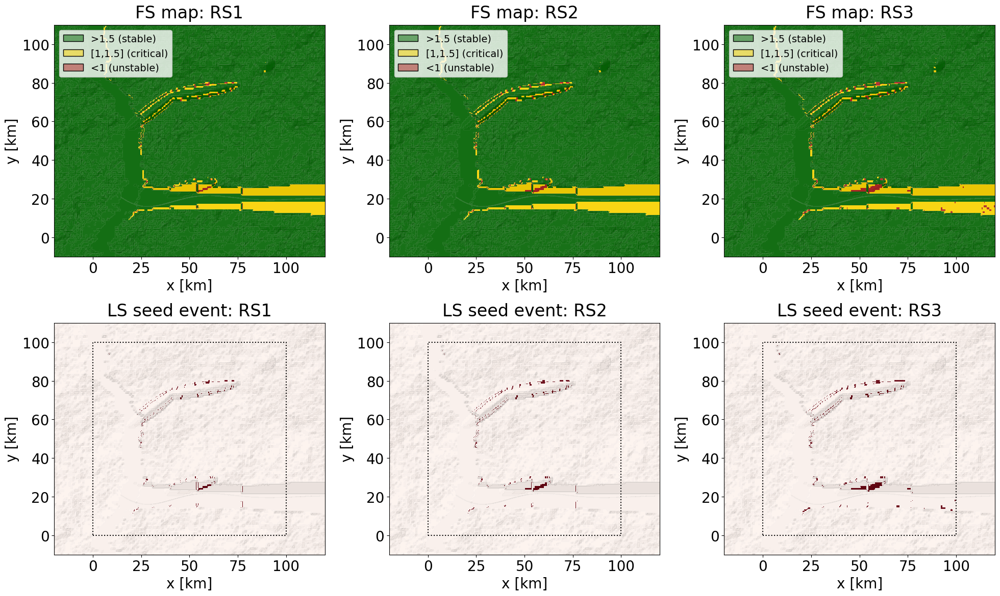

In [16]:
# 1. seed event definition

import re
pattern = re.compile(r'RS(\d+)')  # match "RS" followed by numbers

# Water column [mm/hr] times rainstorm duration gives hw (water height) assumed to fully infiltrate the soil
src['RS']['duration'] = 36    # [hr] <- given the event table, control soil wetness via duration of rainstorm
src['LS'] = {'object': 'topography', 'Ceff_Pa': 20e3, 'phieff_deg': 27, 'rho_kg/m3': 2650} # soil characteristics

tan_slope, aspect = codes.calc_topo_attributes(topoLayer_z, grid.w)
slope = np.arctan(tan_slope) * 180 / np.pi

indperil = np.where(stochset['ID'] == 'LS')[0]
Nev_peril = len(indperil)

plt.rcParams['font.size'] = '20'
fig, ax = plt.subplots(2, 3, figsize=(20,12))

FS_state = np.zeros((Nev_peril,grid.nx,grid.ny))
LSfootprints = np.zeros((Nev_peril,grid.nx, grid.ny))
nx, ny = int(grid.xbuffer/grid.w), int(grid.ybuffer/grid.w)

for i in range(Nev_peril):
    evID = stochset['evID'][indperil].values[i]
    evID_trigger = re.search(pattern, evID).group()
    S_trigger = stochset['S'][stochset['evID'] == evID_trigger].values
    hw = S_trigger * 1e-3 * src['RS']['duration']        # water column [m]
    wetness = hw / soilLayer_hs
    wetness[wetness > 1] = 1                   # max possible saturation
    wetness[soilLayer_hs == 0] = 0             # no soil case

    FS = codes.calc_FS(slope, soilLayer_hs, wetness, src['LS'])
    FS_state[i,:,:] = codes.get_FS_state(FS)
    LSfootprints[i,FS_state[i,:,:] == 2] = 1    # initiates landslide where slope is unstable
    LSfootprints[i,:,:] = codes.zero_boundary_2d(LSfootprints[i,:,:], nx, ny)   # no landslide in buffer zone

    ax[0,i].pcolormesh(grid.xx, grid.yy, FS_state[i,:,:], cmap = codes.col_FS, vmin=0, vmax=2)
    ax[0,i].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
    ax[0,i].legend(handles = codes.legend_FS, loc = 'upper left', fontsize = 14)
    ax[0,i].set_xlabel('x [km]')
    ax[0,i].set_ylabel('y [km]')
    ax[0,i].set_title('FS map: '+evID_trigger, pad = 10)
    ax[0,i].set_aspect(1)
    
    ax[1,i].pcolormesh(grid.xx, grid.yy, LSfootprints[i,:,:], cmap='Reds')
    ax[1,i].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
    ax[1,i].set_xlabel('x [km]')
    ax[1,i].set_ylabel('y [km]')
    ax[1,i].set_title('LS seed event: '+evID_trigger, pad = 10)
    ax[1,i].set_aspect(1)
    ax[1,i].plot([grid.xmin + grid.xbuffer, grid.xmax - grid.xbuffer, grid.xmax - grid.xbuffer, \
         grid.xmin + grid.xbuffer, grid.xmin + grid.xbuffer],
        [grid.ymin + grid.ybuffer, grid.ymin + grid.ybuffer, grid.ymax - grid.ybuffer, \
         grid.ymax - grid.ybuffer, grid.ymin + grid.ybuffer], linestyle = 'dotted', color = 'black')
    
plt.tight_layout();

In [17]:
# 2. event propagation
LSfootprint_seed = LSfootprints[2,:,:]   # here illustrated with last event (RS3 -> LS3)

movie = {'create': True, 'path': 'figures/LS_cellularAutomaton/', \
         'xmin': 38, 'xmax': 68, 'ymin': 20, 'ymax': 35}   # to zoom on specific hill (see movie below)
LSfootprint_hmax = \
    codes.run_CellularAutomaton_LS(LSfootprint_seed, soilLayer_hs, topoLayer_z, grid, src['LS'], wetness, movie)

iteration 1 / 20
iteration 2 / 20
iteration 3 / 20
iteration 4 / 20
iteration 5 / 20
iteration 6 / 20
iteration 7 / 20
iteration 8 / 20
iteration 9 / 20
iteration 10 / 20
iteration 11 / 20
iteration 12 / 20
iteration 13 / 20
iteration 14 / 20
iteration 15 / 20
iteration 16 / 20
iteration 17 / 20
iteration 18 / 20
iteration 19 / 20
iteration 20 / 20


The following movie was obtained by the previous code cell (with default parameterisation). It shows the landslide propagation over time generated by the cellular automaton. The final hazard intensity footprint to be listed in the hazard footprint catalogue is static and equal to $\max_t I(x,y,t)$.

<img src="figures/movie_LS.gif" width = 500>

The full landslide footprint modelling process is encoded in the function `gen_hazFootprints_dyn()` and rerun below for all `LS` events. This completes the hazard footprint catalogue linked to the event table previously defined. Both `stochset` and `hazFootprints` will be used to calculate risk in Section 4 below.

In [18]:
src['RS']['duration'] = 36    # [hr] <- given the event table, control soil wetness via duration of rainstorm
src['LS'] = {'object': 'topography', 'Ceff_Pa': 20e3, 'phieff_deg': 27, 'rho_kg/m3': 2650} # soil characteristics

catalog_hazFootprints_LS = codes.gen_hazFootprints_LS(stochset, src, grid, topoLayer_z, soilLayer_hs)

LS_fromRS1
iteration 1 / 20
iteration 2 / 20
iteration 3 / 20
iteration 4 / 20
iteration 5 / 20
iteration 6 / 20
iteration 7 / 20
iteration 8 / 20
iteration 9 / 20
iteration 10 / 20
iteration 11 / 20
iteration 12 / 20
iteration 13 / 20
iteration 14 / 20
iteration 15 / 20
iteration 16 / 20
iteration 17 / 20
iteration 18 / 20
iteration 19 / 20
iteration 20 / 20
LS_fromRS2
iteration 1 / 20
iteration 2 / 20
iteration 3 / 20
iteration 4 / 20
iteration 5 / 20
iteration 6 / 20
iteration 7 / 20
iteration 8 / 20
iteration 9 / 20
iteration 10 / 20
iteration 11 / 20
iteration 12 / 20
iteration 13 / 20
iteration 14 / 20
iteration 15 / 20
iteration 16 / 20
iteration 17 / 20
iteration 18 / 20
iteration 19 / 20
iteration 20 / 20
LS_fromRS3
iteration 1 / 20
iteration 2 / 20
iteration 3 / 20
iteration 4 / 20
iteration 5 / 20
iteration 6 / 20
iteration 7 / 20
iteration 8 / 20
iteration 9 / 20
iteration 10 / 20
iteration 11 / 20
iteration 12 / 20
iteration 13 / 20
iteration 14 / 20
iteration 15 / 20
iter

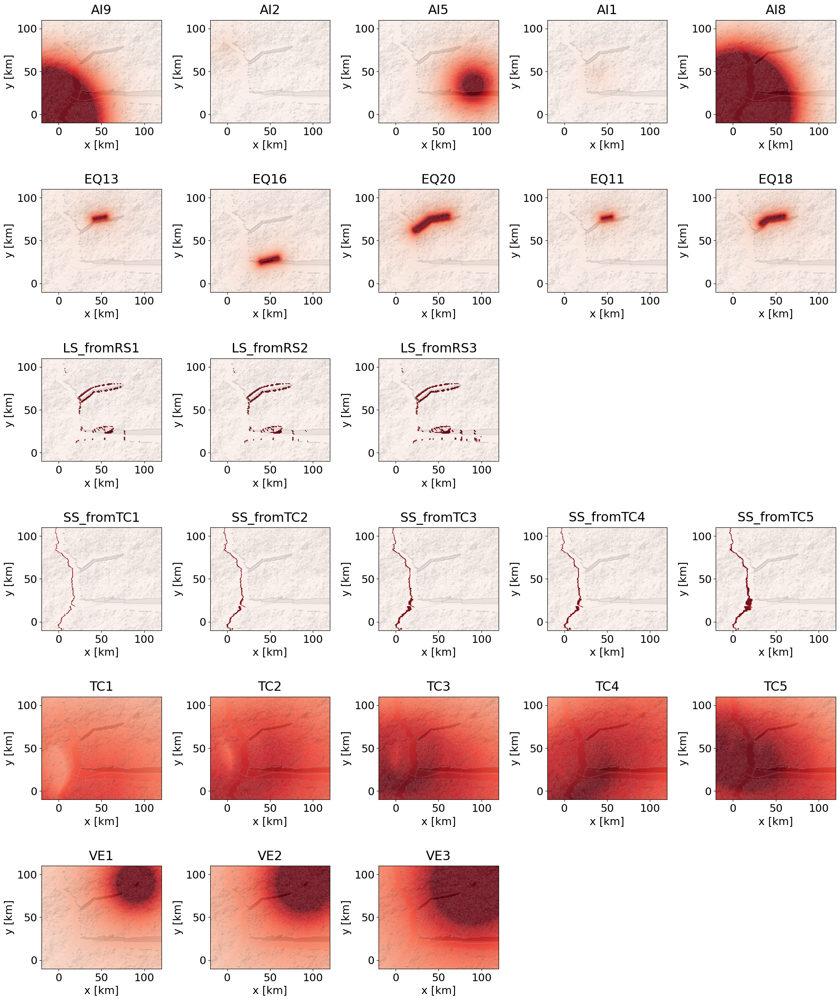

In [19]:
# re-plot selected footprints from catalogue (now including LS)
catalog_hazFootprints.update(catalog_hazFootprints_LS)

plot_Imax = {'AI': 20, 'EQ': 6, 'VE': .5, 'TC': 70., 'SS': 2., 'LS': 2.}
codes.plot_hazFootprints(catalog_hazFootprints, grid, src, topoLayer_z, plot_Imax)  #, nstoch = 5)

The following subsections show how to model `WF` and `FF` events in the sandbox. They won't however be considered in later risk computations.

#### 3.2.2. Wildfire footprints

Wildfires are here modelled using a simple forest-fire model (Section 4.1.5 in textbook). They occur in grid cells covered by trees (state $\mathcal{S} = 1$). `WF` events are then generated via the function `codes.run_CellularAutomaton_WF()`. Note that to make the forest distribution more organic (not just one continous surface which would lead to one mega-fire), a percentage of cells (`ratio_grass`) are first converted to grassland ($\mathcal{S} = 0$) at some random locations.

0 / 25000
1000 / 25000
2000 / 25000
3000 / 25000
4000 / 25000
5000 / 25000
6000 / 25000
7000 / 25000
8000 / 25000
9000 / 25000
10000 / 25000
11000 / 25000
12000 / 25000
13000 / 25000
14000 / 25000
15000 / 25000
16000 / 25000
17000 / 25000
18000 / 25000
19000 / 25000
20000 / 25000
21000 / 25000
22000 / 25000
23000 / 25000
24000 / 25000


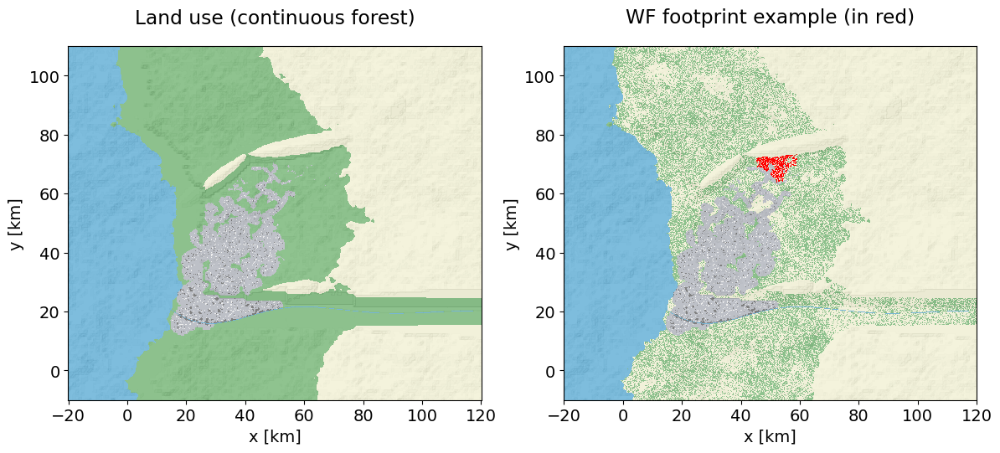

In [20]:
# wildfires
src['WF'] = {'object': 'forest', 'ratio_grass': .6,   # ratio of forest cells to turn to grass at initial state
             'p_lightning': .1,                       # probability of lightning strike per iteration
             'rate_newtrees': 1000,                   # number of new trees to add per iteration
             'nsim': 25000,                           # number of iterations
             'Smin_plot': 1000,                       # minimum WF footprint size to save in 'figures/WF_cellularAutomaton/'
             'path': 'figures/WF_cellularAutomaton/'} # folder path for WF footprints

# to display last modelled WF (all other footprints larger than Smin_plot saved in path folder)
landuseLayer_state_lastWF, hazFootprint_lastWF = codes.run_CellularAutomaton_WF(landuseLayer_state, src, grid, topoLayer_z)

plt.rcParams['font.size'] = '14'
fig, ax = plt.subplots(1, 2, figsize=(14,7))
ax[0].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
ax[0].pcolormesh(grid.xx, grid.yy, landuseLayer_state, cmap = codes.col_S, vmin=-1, vmax=5, alpha = .5)
ax[0].set_xlabel('x [km]')
ax[0].set_ylabel('y [km]')
ax[0].set_title('Land use (continuous forest)', pad = 20)
ax[0].set_aspect(1)

ax[1].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
ax[1].pcolormesh(grid.xx, grid.yy, landuseLayer_state_lastWF, cmap = codes.col_S, vmin=-1, vmax=5, alpha = .5)
ax[1].pcolormesh(grid.xx, grid.yy, hazFootprint_lastWF, cmap = codes.col_S, vmin=-1, vmax=5)
ax[1].set_xlabel('x [km]')
ax[1].set_ylabel('y [km]')
ax[1].set_title('WF footprint example (in red)', pad = 20)
ax[1].set_aspect(1);

#### 3.2.3. Fluvial flood footprints

Fluvial floods are modelled herein using a straightforward and generic cellular automaton, as described in Section 4.1.3 of the textbook, and which algorithm can be found in the function `codes.run_CellularAutomaton_FF()`. Notably, no optimizations were undertaken to enhance the code's efficiency, such as using only part of the grid area, using class instances for object-oriented programming, or implementing parallel processing. Consequently, execution of the ensuing cell may require upwards of one hour.

In [21]:
I_RS = stochset[stochset['evID'] == 'RS3']['S'].values[0] * 1e-3 / 3600    # [mm/hr] to [m/s]
src['RS']['duration'] = 24 #36                   # [hr]

FFfootprint = codes.run_CellularAutomaton_FF(I_RS, src, grid, topoLayer_z)

0.0 hr. / 24.0
1.0 hr. / 24.0
2.0 hr. / 24.0
3.0 hr. / 24.0
4.0 hr. / 24.0
5.0 hr. / 24.0
6.0 hr. / 24.0
7.0 hr. / 24.0
8.0 hr. / 24.0
9.0 hr. / 24.0
10.0 hr. / 24.0
11.0 hr. / 24.0
12.0 hr. / 24.0
13.0 hr. / 24.0
14.0 hr. / 24.0
15.0 hr. / 24.0
16.0 hr. / 24.0
17.0 hr. / 24.0
18.0 hr. / 24.0
19.0 hr. / 24.0
20.0 hr. / 24.0
21.0 hr. / 24.0
22.0 hr. / 24.0
23.0 hr. / 24.0


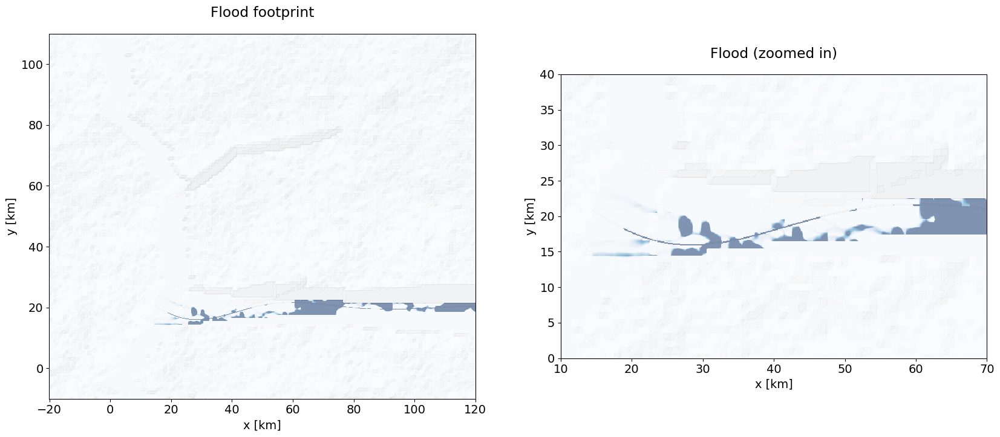

In [22]:
plt.rcParams['font.size'] = '14'
fig, ax = plt.subplots(1, 2, figsize=(20,8))
ax[0].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
ax[0].pcolormesh(grid.xx, grid.yy, FFfootprint, cmap = 'Blues', alpha = .5, vmin=0, vmax=1)
ax[0].set_xlabel('x [km]')
ax[0].set_ylabel('y [km]')
ax[0].set_title('Flood footprint', pad = 20)
ax[0].set_aspect(1)

ax[1].contourf(grid.xx, grid.yy, codes.ls.hillshade(topoLayer_z, vert_exag=.1), cmap='gray', alpha = .1)
ax[1].pcolormesh(grid.xx, grid.yy, FFfootprint, cmap = 'Blues', alpha = .5, vmin=0, vmax=1)
ax[1].set_xlabel('x [km]')
ax[1].set_ylabel('y [km]')
ax[1].set_xlim(10,70)
ax[1].set_ylim(0,40)
ax[1].set_title('Flood (zoomed in)', pad = 20)
ax[1].set_aspect(1)

## 4. Probabilistic risk assessment

In this final section, loss footprints are modelled and total losses per event implemented in the event table (hence turning it into an event loss table, ELT). Risk metrics are finally calculated from the ELT. Functions to generate a YLT and estimate risk metrics from simulations are also provided in `CATRiskModellingSandbox_codes.py` but they are not implemented in this notebook due to high computational costs for large numbers of simulations and since no secondary uncertainty is considered in version 1.1 of this sandbox.

### 4.1. Loss footprint catalogue generation

Damage footprints $D(x,y)$ are defined by mapping hazard intensity footprints $I(x,y)$ into mean damage ratio (MDR) values via the vulnerability functions previously defined. Loss footprints $L(x,y)$ are simply the product of $D(x,y)$ and the exposure footprint $\nu(x,y)$. Figure 2 (fig. 3.11 in the textbook) illustrates the process.

<center><img src="figures/fig3_11_sandbox_fp_COLOR.jpg" width = 800></center>
<center><small><b>Fig. 2.</b> Example of an intensity footprint and of a loss footprint for a large earthquake – Simulation rendered with Rayshader (Morgan-Wall, 2023, https://www.rayshader.com/).</small></center>
<br>

Loss footprints are defined in the function `gen_lossFootprints()` and plotted with the function `plot_lossFootprints()`. It should be noted that losses are calculated for a static exposure footprint. In the case of secondary events which are coupled to primary events, these events are merged into meta-events for simplicity since we assume a conditional probability of 1. This leads into a modified event set where `RS`+`LS` and `TC`+`SS` events are turned into `RS+LS` and `TC+SS` events, respectively (see `ELT`).

generating footprints for:
AI
EQ
TC
VE
SS


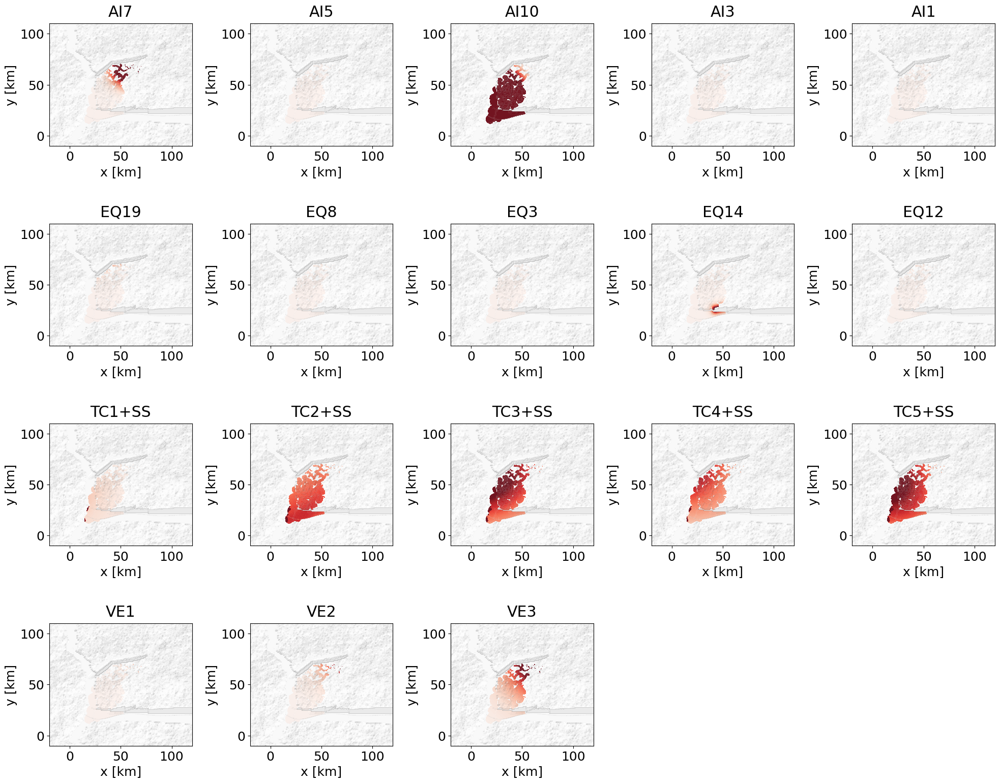

In [10]:
catalog_lossFootprints, ELT = codes.gen_lossFootprints(catalog_hazFootprints, expoFootprint, stochset)

plot_Lmax = 1e6   # [$]
codes.plot_lossFootprints(catalog_lossFootprints, ELT, grid, topoLayer_z, plot_Lmax)

### 4.2. Risk metrics

Risk metrics are calculated from the ELT previously generated via the function `calc_riskmetrics_fromELT()`.

** from ELT **
AAL [$ M.]: 80.80597345311394
VaR_q [$ B.]: 0.6212322385578752
TVaR_q [$ B.]: 48.621114111338045


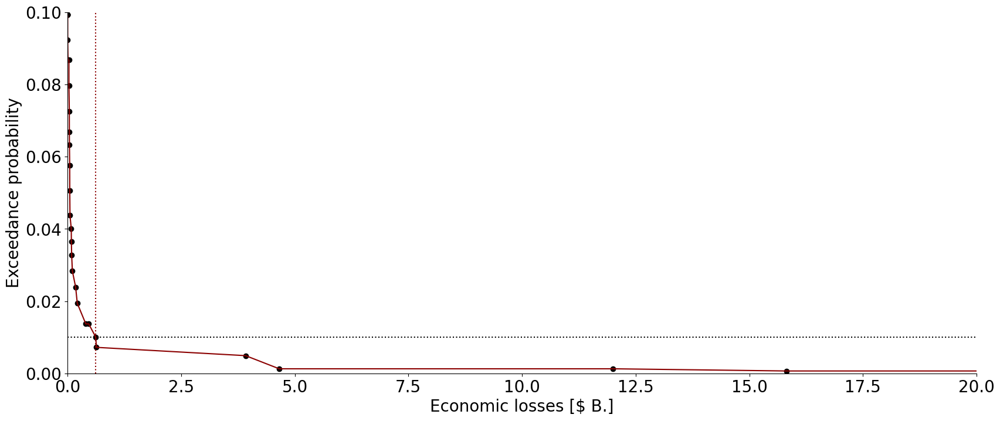

In [11]:
q_VAR = .99
ELT_wEP, AAL, VaRq, TVaRq, _, _ = codes.calc_riskmetrics_fromELT(ELT, q_VAR)

print('** from ELT **')
print('AAL [$ M.]:', AAL * 1e-6)
print('VaR_q [$ B.]:', VaRq * 1e-9)
print('TVaR_q [$ B.]:', TVaRq * 1e-9)  # much higher than VaR due to very long risk tail (default parameterisation)

plt.rcParams['font.size'] = '20'
fig, ax = plt.subplots(1,1, figsize = (20,8))
plt.scatter(ELT_wEP['L'] * 1e-9, ELT_wEP['EP'], color = 'black')
plt.plot(ELT_wEP['L'] * 1e-9, ELT_wEP['EP'], color = 'darkred')
plt.axhline(y = 1 - q_VAR, linestyle = 'dotted', color = 'black')
plt.axvline(x = VaRq * 1e-9, linestyle = 'dotted', color = 'darkred')
plt.xlim(0,20)
plt.ylim(0,.1)
plt.xlabel('Economic losses [$ B.]')
plt.ylabel('Exceedance probability')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

In [12]:
ELT_wEP

,ID,evID,lbd,L,EF,EP
7,AI,AI8,1.994471e-07,2.941912e+11,1.994471e-07,1.994471e-07
8,AI,AI9,1.994471e-07,2.868614e+11,3.988942e-07,3.988942e-07
9,AI,AI10,1.994471e-07,2.737521e+11,5.983414e-07,5.983412e-07
37,TC+SS,TC5+SS,8.826349e-05,9.367153e+10,8.886183e-05,8.885788e-05
35,TC+SS,TC3+SS,9.923821e-05,8.699563e+10,1.881000e-04,1.880824e-04
34,TC+SS,TC2+SS,3.677710e-04,7.044109e+10,5.558711e-04,5.557166e-04
3,AI,AI4,1.188199e-06,6.618913e+10,5.570593e-04,5.569041e-04
36,TC+SS,TC4+SS,9.923821e-05,5.418390e+10,6.562975e-04,6.560822e-04
40,VE,VE3,3.924750e-07,2.899685e+10,6.566900e-04,6.564744e-04
6,AI,AI7,1.188199e-06,1.581529e+10,6.578782e-04,6.576618e-04
